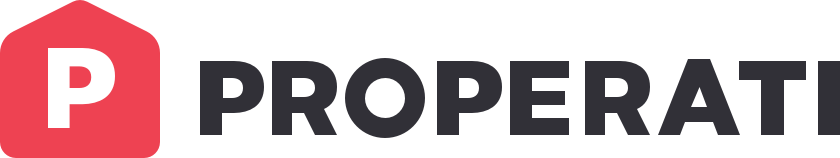

## Real Estate Market Analysis

PROPERATI is the digital real estate platform expert in helping you find your new home. Those looking for a new home or wanting to invest in properties will find 100% personalized free real estate advice at PROPERATI, all the available market offerings and valuable information to make the best decisions.

In [2]:
## Importamos Librerias

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas import Series
%matplotlib inline
import math

#### Import dataset of Properati

The dataset that we are going to be using is from Properati and contains the properties for sale in the Argentine Republic.}

#### Columns:

- id: property id
- created_on: date the property entered the site
- operation: rent (rent) or sale (sell)
- property_type: type of property (house, apartment, townhouse, etc.)
- place_with_parent_names: name of the place where the property is located according to the publisher
- lat-lon: concatenated coordinates
- lat: latitude
- lon: length
- price: price in the currency specified in currency
- currency: currency in which the publication is expressed
- price_aprox_usd: approximate price in US dollars
- surface_total_in_m2: total area (in square meters)
- surface_covered_in_m2: covered area (in square meters)
- price_usd_per_m2: price per square meter in dollars (price dollars / surface)
- floor: floor number (if applicable)
- rooms: number of rooms
- expenses: expenses (if applicable)
- neighborhood: neighborhood according to official cartography
- properati_url: url of the publication in Properati

In [3]:
df = pd.read_csv("properati.csv")

In [4]:
df

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,...,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,1,sell,apartment,La Plata,|Argentina|Bs.As. G.B.A. Zona Sur|La Plata|,Argentina,Bs.As. G.B.A. Zona Sur,3432039.0,"-34.9038831,-57.9643295",-34.903883,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15bob_venta_depart...,Venta de departamento en décimo piso al frente...,VENTA Depto 2 dorm. a estrenar 7 e/ 36 y 37 ...,https://thumbs4.properati.com/7/ikpVBu2ztHA7jv...
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,...,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
4,4,sell,apartment,Centro,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3435548.0,"-38.0026256,-57.5494468",-38.002626,...,35.0,1828.571429,1828.571429,NaN,NaN,NaN,http://www.properati.com.ar/15bok_venta_depart...,DEPARTAMENTO CON FANTÁSTICA ILUMINACIÓN NATURA...,DEPTO 2 AMB AL CONTRAFRENTE ZONA CENTRO/PLAZA ...,https://thumbs4.properati.com/5/xrRqlNcSI_vs-f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121215,121215,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,NaN,NaN,...,93.0,7699.115044,9354.838710,NaN,NaN,10000.0,http://www.properati.com.ar/1cja2_venta_depart...,TORRE FORUM ALCORTA - MÁXIMA CATEGORÍA.Impecab...,Torre Forum Alcorta- Impecable 3 ambientes,https://thumbs4.properati.com/1/bjms0KnaAnlNoQ...
121216,121216,sell,house,Beccar,|Argentina|Bs.As. G.B.A. Zona Norte|San Isidro...,Argentina,Bs.As. G.B.A. Zona Norte,3436080.0,NaN,NaN,...,360.0,1383.333333,1383.333333,NaN,NaN,NaN,http://www.properati.com.ar/1cja6_venta_casa_b...,Excelente e impecable casa en Venta en Las Lom...,Ruca Inmuebles | Venta | Lomas de San Isidro |...,https://thumbs4.properati.com/2/PCc3WuQDjpNZc4...
121217,121217,sell,apartment,Villa Urquiza,|Argentina|Capital Federal|Villa Urquiza|,Argentina,Capital Federal,3433775.0,"-34.5706388726,-58.4755963355",-34.570639,...,39.0,2858.695652,3371.794872,NaN,NaN,NaN,http://www.properati.com.ar/1cja7_venta_depart...,VENTA DEPARTAMENTO AMBIENTE DIVISIBLE A ESTREN...,VENTA DEPARTAMENTO AMBIENTE DIVISIBLE A ESTREN...,https://thumbs4.properati.com/9/YAe_-2gRVykADP...
121218,121218,sell,apartment,Plaza Colón,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,NaN,NaN,NaN,...,48.0,1997.916667,1997.916667,NaN,NaN,NaN,http://www.properati.com.ar/1cja8_venta_depart...,"2 Amb al contrafrente, luminoso. El departame...",2 amb. C/ dep. de servicio al contrafrente| Re...,https://thumbs4.properati.com/8/Q12PTvU6BQJ0ib...


#### Exploratory Data Analysis

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121220 entries, 0 to 121219
Data columns (total 21 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Unnamed: 0                  121220 non-null  int64  
 1   operation                   121220 non-null  object 
 2   property_type               121220 non-null  object 
 3   place_name                  121197 non-null  object 
 4   country_name                121220 non-null  object 
 5   state_name                  121220 non-null  object 
 6   geonames_id                 102503 non-null  float64
 7   lat-lon                     69670 non-null   object 
 8   lat                         69670 non-null   float64
 9   lon                         69670 non-null   float64
 10  price                       100810 non-null  float64
 11  currency                    100809 non-null  object 
 12  price_aprox_local_currency  100810 non-null  float64
 13  price_aprox_us

In [97]:
df.shape

(121220, 21)

In [98]:
df.describe()

,Unnamed: 0,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
count,121220.000000,1.025030e+05,69670.000000,69670.000000,1.008100e+05,1.008100e+05,1.008100e+05,81892.000000,101313.000000,68617.000000,8.765800e+04,7899.000000,47390.000000,1.426200e+04
mean,60609.500000,3.574442e+06,-34.626210,-59.266290,4.685259e+05,4.229397e+06,2.397006e+05,233.795328,133.050181,2160.086916,6.912216e+03,17.452336,3.080840,5.009234e+03
std,34993.344153,3.541306e+05,1.980936,2.299922,2.260101e+06,6.904714e+06,3.913239e+05,1782.222147,724.351479,2759.288621,2.837864e+04,120.243621,1.860773,1.204403e+05
min,0.000000,3.427208e+06,-54.823985,-75.678931,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.600000,1.510204e+00,1.000000,1.000000,1.000000e+00
25%,30304.750000,3.430234e+06,-34.669065,-58.727040,1.100000e+05,1.583309e+06,8.973388e+04,50.000000,45.000000,1218.181818,1.550000e+03,1.000000,2.000000,1.000000e+03
50%,60609.500000,3.433910e+06,-34.597985,-58.480128,1.850000e+05,2.558452e+06,1.450000e+05,84.000000,75.000000,1800.000000,2.213115e+03,3.000000,3.000000,2.000000e+03
75%,90914.250000,3.836668e+06,-34.441299,-58.395908,4.200000e+05,4.675792e+06,2.650000e+05,200.000000,150.000000,2486.411765,3.355549e+03,6.000000,4.000000,4.000000e+03
max,121219.000000,6.948895e+06,4.545843,-53.733330,6.500000e+08,8.212711e+08,4.654544e+07,200000.000000,187000.000000,206333.333333,4.000000e+06,3150.000000,32.000000,1.000150e+07


In [99]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,121220.0,6.060950e+04,3.499334e+04,0.000000e+00,3.030475e+04,6.060950e+04,9.091425e+04,1.212190e+05
geonames_id,102503.0,3.574442e+06,3.541306e+05,3.427208e+06,3.430234e+06,3.433910e+06,3.836668e+06,6.948895e+06
lat,69670.0,-3.462621e+01,1.980936e+00,-5.482398e+01,-3.466907e+01,-3.459799e+01,-3.444130e+01,4.545843e+00
lon,69670.0,-5.926629e+01,2.299922e+00,-7.567893e+01,-5.872704e+01,-5.848013e+01,-5.839591e+01,-5.373333e+01
price,100810.0,4.685259e+05,2.260101e+06,0.000000e+00,1.100000e+05,1.850000e+05,4.200000e+05,6.500000e+08
price_aprox_local_currency,100810.0,4.229397e+06,6.904714e+06,0.000000e+00,1.583309e+06,2.558452e+06,4.675792e+06,8.212711e+08
price_aprox_usd,100810.0,2.397006e+05,3.913239e+05,0.000000e+00,8.973388e+04,1.450000e+05,2.650000e+05,4.654544e+07
surface_total_in_m2,81892.0,2.337953e+02,1.782222e+03,0.000000e+00,5.000000e+01,8.400000e+01,2.000000e+02,2.000000e+05
surface_covered_in_m2,101313.0,1.330502e+02,7.243515e+02,0.000000e+00,4.500000e+01,7.500000e+01,1.500000e+02,1.870000e+05
price_usd_per_m2,68617.0,2.160087e+03,2.759289e+03,6.000000e-01,1.218182e+03,1.800000e+03,2.486412e+03,2.063333e+05


In [100]:
from pandas_profiling import ProfileReport

ProfileReport(df)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [101]:
from funpymodeling.exploratory import status

status(df)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,Unnamed: 0,0,0.000000,1,0.000008,121220,int64
1,operation,0,0.000000,0,0.000000,1,object
2,property_type,0,0.000000,0,0.000000,4,object
3,place_name,23,0.000190,0,0.000000,1060,object
4,country_name,0,0.000000,0,0.000000,1,object
5,state_name,0,0.000000,0,0.000000,28,object
6,geonames_id,18717,0.154405,0,0.000000,646,float64
7,lat-lon,51550,0.425260,0,0.000000,47203,object
8,lat,51550,0.425260,0,0.000000,46495,float64
9,lon,51550,0.425260,0,0.000000,46522,float64


array([[<AxesSubplot:title={'center':'Unnamed: 0'}>,
        <AxesSubplot:title={'center':'geonames_id'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lon'}>],
       [<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'price_aprox_local_currency'}>,
        <AxesSubplot:title={'center':'price_aprox_usd'}>,
        <AxesSubplot:title={'center':'surface_total_in_m2'}>],
       [<AxesSubplot:title={'center':'surface_covered_in_m2'}>,
        <AxesSubplot:title={'center':'price_usd_per_m2'}>,
        <AxesSubplot:title={'center':'price_per_m2'}>,
        <AxesSubplot:title={'center':'floor'}>],
       [<AxesSubplot:title={'center':'rooms'}>,
        <AxesSubplot:title={'center':'expenses'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

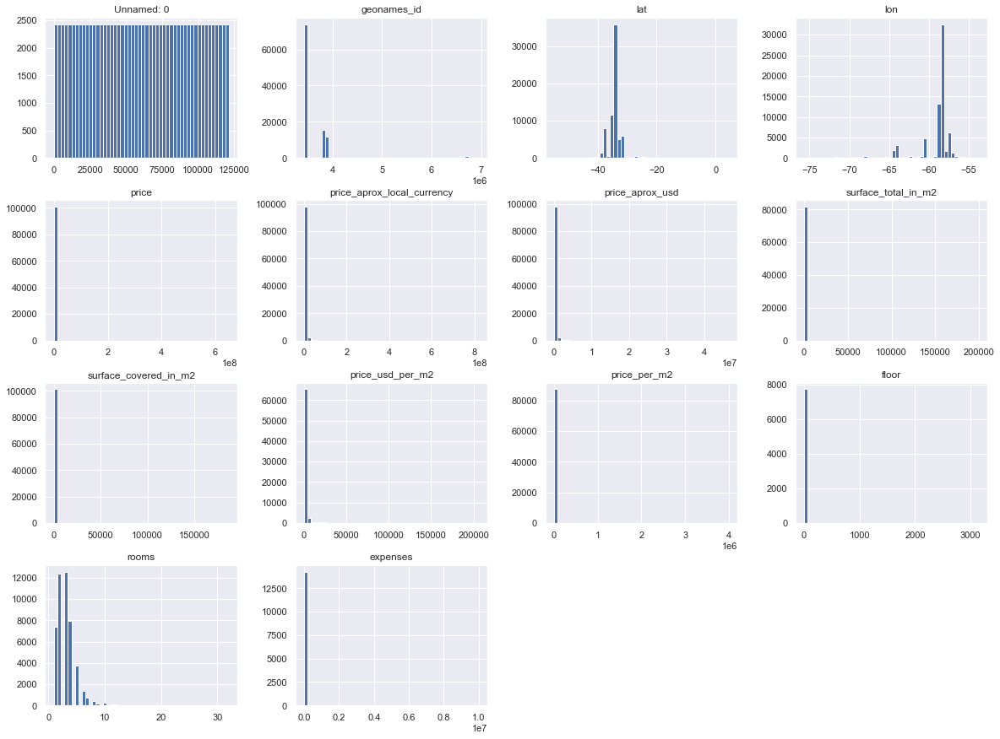

In [105]:
df.hist(bins = 50, figsize=(20,15))

#### Analyze nulls

In [5]:
df.isna().sum()

Unnamed: 0                         0
operation                          0
property_type                      0
place_name                        23
place_with_parent_names            0
country_name                       0
state_name                         0
geonames_id                    18717
lat-lon                        51550
lat                            51550
lon                            51550
price                          20410
currency                       20411
price_aprox_local_currency     20410
price_aprox_usd                20410
surface_total_in_m2            39328
surface_covered_in_m2          19907
price_usd_per_m2               52603
price_per_m2                   33562
floor                         113321
rooms                          73830
expenses                      106958
properati_url                      0
description                        2
title                              0
image_thumbnail                 3112
dtype: int64

#### We graph the columns to see the amount of nulls we have in each one

<AxesSubplot:>

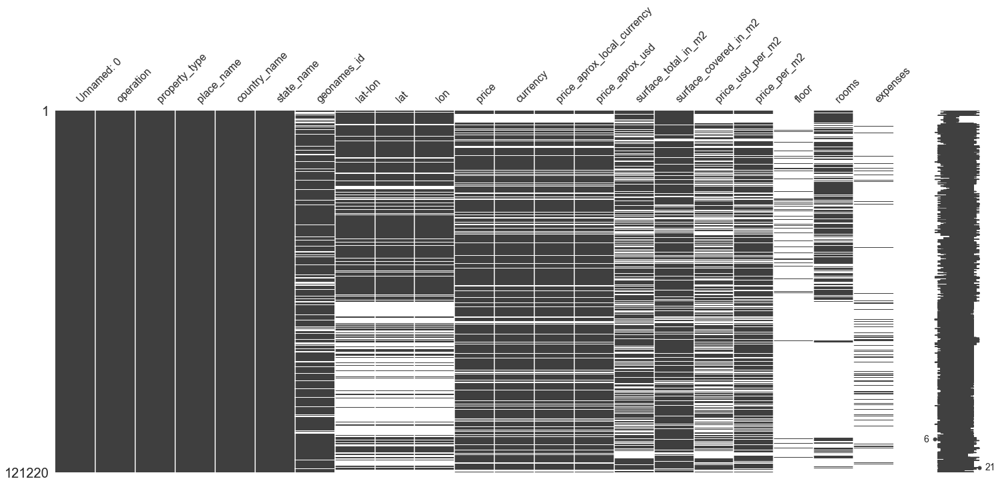

In [102]:
import missingno as msno

msno.matrix(df)

#### We eliminate everything that we do not need and it will not be useful for the analysis

In [ ]:
del df['image_thumbnail']

In [5]:
del df['properati_url']

In [6]:
del df['place_with_parent_names']

In [7]:
del df['title']

In [8]:
del df['description']

#### We analyze correlation between variables

In [104]:
df.corr()

,Unnamed: 0,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
Unnamed: 0,1.000000,0.056876,0.055474,-0.013745,0.033342,-0.037480,-0.037480,-3.547324e-02,-0.002959,-0.030739,0.036578,-0.063240,0.146631,-1.094722e-02
geonames_id,0.056876,1.000000,0.166446,-0.293347,0.037997,-0.041616,-0.041616,2.350088e-04,-0.005824,-0.041274,0.056873,-0.025147,0.063870,-2.736558e-03
lat,0.055474,0.166446,1.000000,-0.294338,0.174643,0.067063,0.067063,9.125336e-03,0.008079,0.050212,0.086109,-0.040754,0.098654,4.695984e-03
lon,-0.013745,-0.293347,-0.294338,1.000000,-0.187412,-0.026092,-0.026092,-4.066232e-02,-0.009536,0.038563,-0.087840,0.059644,-0.161893,-2.613714e-03
price,0.033342,0.037997,0.174643,-0.187412,1.000000,0.329037,0.329037,1.134865e-01,0.047523,0.111961,0.501541,-0.009257,0.128777,8.051121e-03
price_aprox_local_currency,-0.037480,-0.041616,0.067063,-0.026092,0.329037,1.000000,1.000000,3.011366e-01,0.165531,0.311328,0.056121,-0.003029,0.182916,1.100998e-02
price_aprox_usd,-0.037480,-0.041616,0.067063,-0.026092,0.329037,1.000000,1.000000,3.011366e-01,0.165531,0.311328,0.056121,-0.003029,0.182916,1.100998e-02
surface_total_in_m2,-0.035473,0.000235,0.009125,-0.040662,0.113487,0.301137,0.301137,1.000000e+00,0.195453,-0.047708,-0.021952,0.013522,0.106810,7.945656e-07
surface_covered_in_m2,-0.002959,-0.005824,0.008079,-0.009536,0.047523,0.165531,0.165531,1.954531e-01,1.000000,-0.050408,-0.020582,-0.000677,0.162912,7.976653e-04
price_usd_per_m2,-0.030739,-0.041274,0.050212,0.038563,0.111961,0.311328,0.311328,-4.770796e-02,-0.050408,1.000000,0.177082,0.158965,-0.173599,1.662794e-02


Ploteamos la correlación entre los datos

<ipython-input-5-ef36d62b872b>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cor.values[[np.arange(6)]*2] = 0


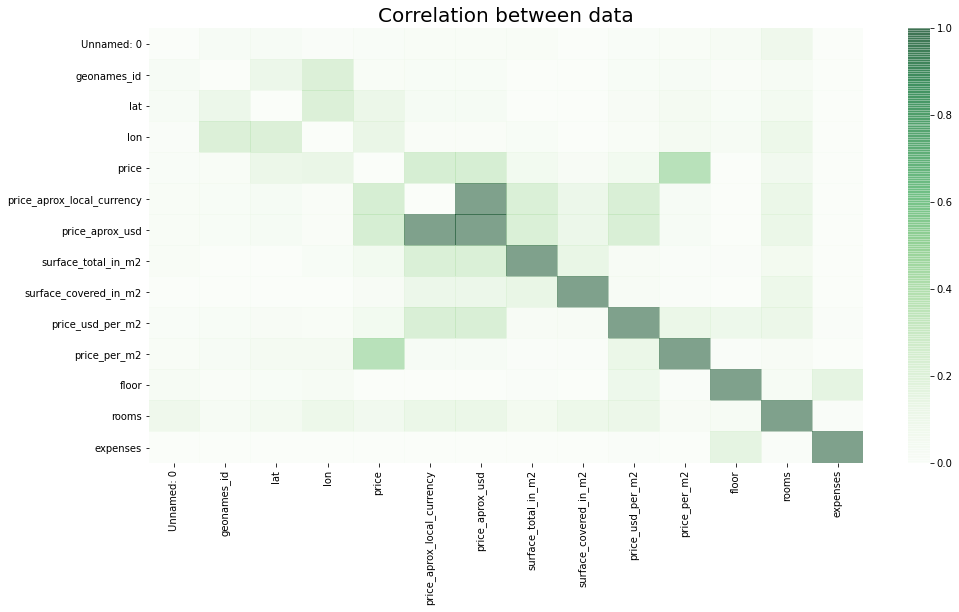

In [5]:
fig, ax = plt.subplots(figsize=(16,8))         # Sample figsize in inches
cor = df.corr().abs()
cor.values[[np.arange(6)]*2] = 0
ax = plt.axes()
sns.heatmap(cor,cmap='Greens', alpha=0.5,ax=ax);
ax.set_title('Correlation between data', fontsize=20)
plt.show();

#### Analyze the dataset

In [25]:
## Amount by property type

prop = df['property_type'].value_counts(normalize=True).sort_values(ascending= False )

prop

apartment    0.586248
house        0.332189
PH           0.047443
store        0.034120
Name: property_type, dtype: float64

In [26]:
## Amount for location

lugares = df['place_name'].value_counts(normalize=True).head(10).sort_values(ascending= False )

lugares

Córdoba          0.076355
Rosario          0.070167
Mar del Plata    0.053912
Tigre            0.027426
Nordelta         0.027352
Belgrano         0.024687
Palermo          0.023804
La Plata         0.020908
Caballito        0.018755
Pilar            0.018383
Name: place_name, dtype: float64

In [27]:
## Operation to be carried out

op = df['operation'].value_counts(normalize=True).sort_values(ascending= False )

op

sell    1.0
Name: operation, dtype: float64

In [28]:
## Amount of rooms


room = df['rooms'].value_counts(normalize=True).sort_values(ascending= False ).head(5)

room

3.0    0.265183
2.0    0.262355
4.0    0.167483
1.0    0.155666
5.0    0.079806
Name: rooms, dtype: float64

In [29]:
## Highest price

max(df['price_aprox_usd'])

46545445.0

In [30]:
## Lowest price

min(df['price_aprox_usd'])

0.0

In [31]:
df.surface_total_in_m2.describe()

count     81892.000000
mean        233.795328
std        1782.222147
min           0.000000
25%          50.000000
50%          84.000000
75%         200.000000
max      200000.000000
Name: surface_total_in_m2, dtype: float64

## Buscamos propiedades que tengan inconsistencias 

In [9]:
## Properties with more m2 covered than in total

a = df.loc[df.surface_covered_in_m2 > df.surface_total_in_m2]
a

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
78,78,sell,house,Posadas,|Argentina|Misiones|Posadas|,Argentina,Misiones,3429886.0,"-27.3554665957,-55.9021115026",-27.355467,...,18615.0,1181.839923,295.460650,NaN,5.0,NaN,http://www.properati.com.ar/15byn_venta_casa_p...,"S/AVDA COSTANERA , NUEVA ZONA GASTRONOMICA...",Oportunidad! Casa zona Bahía el Brete,https://thumbs4.properati.com/2/18AMH0DDp4Xboq...
177,177,sell,apartment,Villa Carlos Paz,|Argentina|Córdoba|Villa Carlos Paz|,Argentina,Córdoba,3832791.0,"-31.4200736,-64.4947113",-31.420074,...,450.0,1119.047619,1044.444444,NaN,9.0,NaN,http://www.properati.com.ar/15dcr_venta_depart...,"CASA PRINCIPAL QUE CONSTA DE 3 DORM,.AMPLIOS,2...",SE VENDE VIVIENDA+LOCALES COMERCIALES+DPTOS,https://thumbs4.properati.com/1/8CEW3VYy-qcIXl...
316,316,sell,house,Capital Federal,|Argentina|Capital Federal|,Argentina,Capital Federal,3433955.0,NaN,NaN,...,156.0,3440.000000,2756.410256,NaN,NaN,NaN,http://www.properati.com.ar/15e1h_venta_casa_b...,Buena ubicaciÃ³n. Muy buen acceso. Lezica esq....,"Casa 125m² con 3 Plantas en Lezica, Martín 300...",https://thumbs4.properati.com/2/9uEFg6nWxNPZnS...
317,317,sell,house,Capital Federal,|Argentina|Capital Federal|,Argentina,Capital Federal,3433955.0,NaN,NaN,...,156.0,3440.000000,2756.410256,NaN,NaN,NaN,http://www.properati.com.ar/15e1i_venta_casa_b...,Buena ubicaciÃ³n. Muy buen acceso. Lezica esq....,"Casa 125m² con 3 Plantas en Lezica, Martín 300...",https://thumbs4.properati.com/8/ebEGvg4mGT9rsd...
455,455,sell,house,Mar del Plata,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3430863.0,"-37.9638994,-57.5790314",-37.963899,...,430.0,700.000000,276.744186,NaN,4.0,NaN,http://www.properati.com.ar/15en5_venta_casa_m...,CHALET TOTALMENTE DESARROLLADO EN PLANTA BAJA ...,chalet 4 ambientes apto credito,https://thumbs4.properati.com/0/PTEiHyUdNIhOGb...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120168,120168,sell,house,Necochea,|Argentina|Buenos Aires Costa Atlántica|Necochea|,Argentina,Buenos Aires Costa Atlántica,3430442.0,"-38.5558902,-58.7493098",-38.555890,...,140.0,1083.333333,928.571429,NaN,6.0,NaN,http://www.properati.com.ar/1chlo_venta_casa_n...,"casa en dos plantas, primer piso tres dormitor...",casa en dos plantas 4 dormitorios,https://thumbs4.properati.com/4/kadYIYVUCHdM_O...
120181,120181,sell,house,Córdoba,|Argentina|Córdoba|Córdoba|,Argentina,Córdoba,3860259.0,"-31.3915783,-64.1374518",-31.391578,...,226.0,751.447908,9070.796460,NaN,3.0,NaN,http://www.properati.com.ar/1chma_venta_casa_c...,"Casa Yofre Sur , APTO CRÉDITO, Córdoba 3 habit...","Vendo Casa Yofre Sur , APTO CRÉDITO, Córdoba",https://thumbs4.properati.com/2/9CESOEksu8h7EK...
120202,120202,sell,PH,Mar del Plata,|Argentina|Buenos Aires Costa Atlántica|Mar de...,Argentina,Buenos Aires Costa Atlántica,3430863.0,"-38.0301135836,-57.5744417429",-38.030114,...,200.0,714.285714,250.000000,NaN,3.0,NaN,http://www.properati.com.ar/1chn1_venta_ph_mar...,"Hermoso PH Con dos Habitaciones, una en suite ...","Excelente PH en impecables condiciónes, Digno ...",https://thumbs4.properati.com/5/UxtgEmnHjjQKNN...
120302,120302,sell,house,Pilar,|Argentina|Bs.As. G.B.A. Zona Norte|Pilar|,Argentina,Bs.As. G.B.A. Zona Norte,3429979.0,NaN,NaN,...,12000.0,1083.333333,108.333333,NaN,NaN,20000.0,http://www.properati.com.ar/1chr7_venta_casa_p...,Impecable casa en alquiler Lote de 3500m2 Casa...,Casa - Haras Del Sol - 1100m2 cubiertos,https://thumbs4.properati.com/9/1XYN9N7nCxhs4C...


We eliminate them because they do not serve us

In [10]:
del a

We look for if there is any record that marks a higher price in USD per m2 than the total price in USD.

In [18]:
b = df.loc[df.price_aprox_usd < df.price_usd_per_m2]
b

,Unnamed: 0,operation,property_type,place_name,country_name,state_name,geonames_id,lat-lon,lat,lon,...,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses


#### Look for outliers


Text(0.5, 0, 'Highest price in USD')

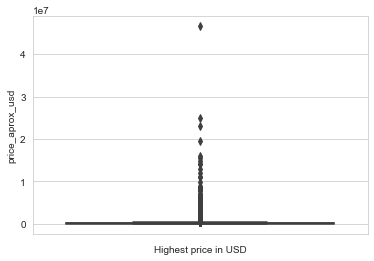

In [11]:
sns.set_style("whitegrid")

ax = sns.boxplot(y="price_aprox_usd", data=df)
ax.set_xlabel('Highest price in USD')

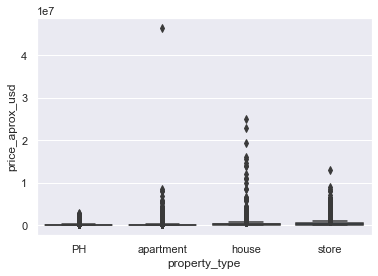

In [20]:
sns.set(style="darkgrid")

sns.boxplot(x=df["property_type"], y=df["price_aprox_usd"], palette="Blues")
plt.show()

We detect that there are a large number of outliers so we must treat them in some way. The boxplots are plotted in this way because there are a large number of outliers, that is, values that are out of the ordinary that are in error or because they represent true cases but for the analysis of the set that we carry out, it is not useful to take us into account. This is also evident when we do a describe and see that the quantiles and the maximum value are very close.

In [21]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,121220.0,6.060950e+04,3.499334e+04,0.000000e+00,3.030475e+04,6.060950e+04,9.091425e+04,1.212190e+05
geonames_id,102503.0,3.574442e+06,3.541306e+05,3.427208e+06,3.430234e+06,3.433910e+06,3.836668e+06,6.948895e+06
lat,69670.0,-3.462621e+01,1.980936e+00,-5.482398e+01,-3.466907e+01,-3.459799e+01,-3.444130e+01,4.545843e+00
lon,69670.0,-5.926629e+01,2.299922e+00,-7.567893e+01,-5.872704e+01,-5.848013e+01,-5.839591e+01,-5.373333e+01
price,100810.0,4.685259e+05,2.260101e+06,0.000000e+00,1.100000e+05,1.850000e+05,4.200000e+05,6.500000e+08
price_aprox_local_currency,100810.0,4.229397e+06,6.904714e+06,0.000000e+00,1.583309e+06,2.558452e+06,4.675792e+06,8.212711e+08
price_aprox_usd,100810.0,2.397006e+05,3.913239e+05,0.000000e+00,8.973388e+04,1.450000e+05,2.650000e+05,4.654544e+07
surface_total_in_m2,81892.0,2.337953e+02,1.782222e+03,0.000000e+00,5.000000e+01,8.400000e+01,2.000000e+02,2.000000e+05
surface_covered_in_m2,101313.0,1.330502e+02,7.243515e+02,0.000000e+00,4.500000e+01,7.500000e+01,1.500000e+02,1.870000e+05
price_usd_per_m2,68617.0,2.160087e+03,2.759289e+03,6.000000e-01,1.218182e+03,1.800000e+03,2.486412e+03,2.063333e+05


#### We delete outliers

What you will see here is if there are prices that are very far from the average, that were either badly loaded, or they really exist, but all they do is negatively affect the analyzes that will be carried out. This is why any price that is too far from the average will be filtered, "purifying" our data set.

We analyze the quartiles

In [22]:
Q1=df.quantile(0.25)
Q3=df['price_aprox_usd'].quantile(0.75)
IQR=Q3-Q1
print(Q1)
print(Q3)
print(IQR)
Lower_Whisker = Q1-1.5*IQR
Upper_Whisker = Q3+1.5*IQR
print( Lower_Whisker, Upper_Whisker)

Unnamed: 0                    3.030475e+04
geonames_id                   3.430234e+06
lat                          -3.466907e+01
lon                          -5.872704e+01
price                         1.100000e+05
price_aprox_local_currency    1.583309e+06
price_aprox_usd               8.973388e+04
surface_total_in_m2           5.000000e+01
surface_covered_in_m2         4.500000e+01
price_usd_per_m2              1.218182e+03
price_per_m2                  1.550000e+03
floor                         1.000000e+00
rooms                         2.000000e+00
expenses                      1.000000e+03
Name: 0.25, dtype: float64
265000.0
Unnamed: 0                    2.346952e+05
geonames_id                  -3.165234e+06
lat                           2.650347e+05
lon                           2.650587e+05
price                         1.550000e+05
price_aprox_local_currency   -1.318309e+06
price_aprox_usd               1.752661e+05
surface_total_in_m2           2.649500e+05
surface_covered_in

In [23]:
df[['price_aprox_usd']].describe()


,price_aprox_usd
count,1.008100e+05
mean,2.397006e+05
std,3.913239e+05
min,0.000000e+00
25%,8.973388e+04
50%,1.450000e+05
75%,2.650000e+05
max,4.654544e+07


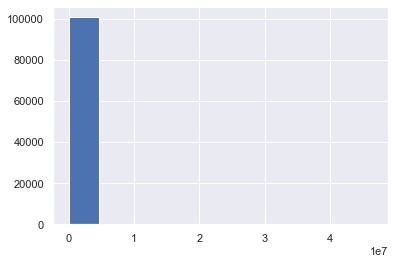

In [24]:
f = plt.hist(df['price_aprox_usd'].dropna().values)
plt.show()

Filtramos valores outliers de la columna 'price_aprox_usd'

In [14]:
properati_filtered = df[(df.price_aprox_usd < df.price_aprox_usd.quantile(.95)) & (df.price_aprox_usd > df.price_aprox_usd.quantile(.02))]

In [15]:
properati_filtered2 = df[(df.price_usd_per_m2 < df.price_usd_per_m2.quantile(.95)) & (df.price_usd_per_m2 > df.price_usd_per_m2.quantile(.02))]

In [16]:
properati_filtered3 = df[(df.price_aprox_local_currency< df.price_aprox_local_currency.quantile(.95)) 
                         & (df.price_aprox_local_currency > df.price_aprox_local_currency.quantile(.02))]

In [17]:
properati_filtered4 = df[(df.price_per_m2< df.price_per_m2.quantile(.95)) & (df.price_per_m2 > df.price_per_m2.quantile(.02))]

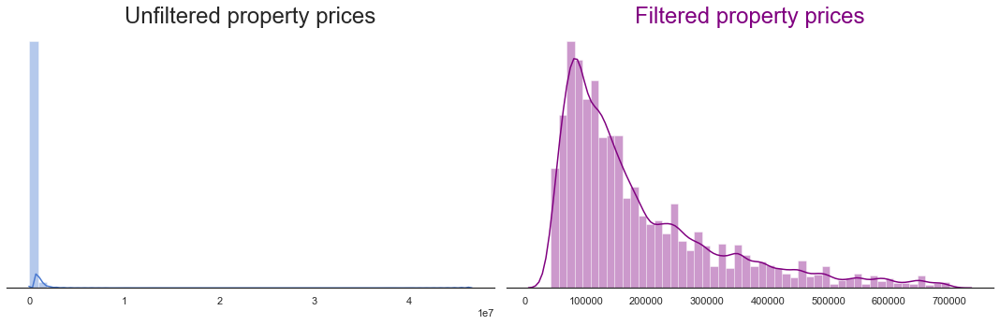

In [18]:
sns.set(style="white", palette="muted", color_codes=True)
rs = np.random.RandomState(10)

# Set up the matplotlib figure
f, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.despine(left=True)


g1=sns.distplot(df[['price_aprox_usd']],ax=axes[0])
g1.axes.set_title('Unfiltered property prices', fontsize=24)

g2 = sns.distplot(properati_filtered[['price_aprox_usd']], color="purple",ax=axes[1])
g2.axes.set_title('Filtered property prices', fontsize=24,  color="purple")

plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

El gráfico de la izquierda habla de una distribución con muchos casos en 0 y con algunos casos de 1200000 usd, que resultan en un gráfico con forma de "L". Dado que no tiene mucho sentido trabajar con precios nulos, se decidió eliminarlos. Para ver una distribución de los precios, se eliminaron los cuantiles 0-2 y 95-100, permitiéndo visualizar el grueso de los casos y entender mejor cómo se agrupan los precios en un histograma. El gráfico de la derecha muestra el histograma resultante de filtrar los casos mencionados, pudiendo observar que la mayoría de los casos tienen un valor aproximado de 100.000 usd.

Filtramos valores outliers de la columna 'price_usd_per_m2'

In [124]:
df[['price_usd_per_m2']].describe()

,price_usd_per_m2
count,68617.000000
mean,2160.086916
std,2759.288621
min,0.600000
25%,1218.181818
50%,1800.000000
75%,2486.411765
max,206333.333333


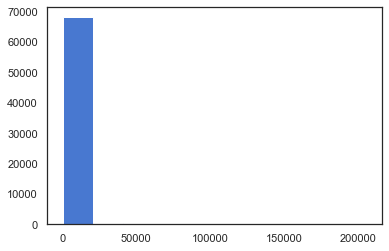

In [125]:
f2 = plt.hist(df['price_usd_per_m2'].dropna().values)
plt.show()

In [126]:
properati_filtered = df[(df.price_usd_per_m2 < df.price_usd_per_m2.quantile(.95)) & (df.price_usd_per_m2 > df.price_usd_per_m2.quantile(.02))]

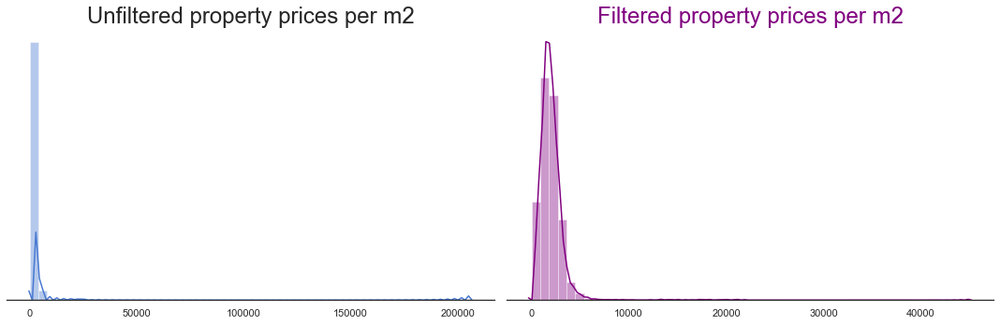

In [19]:
sns.set(style="white", palette="muted", color_codes=True)
rs = np.random.RandomState(10)

# Set up the matplotlib figure
f, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.despine(left=True)


g1=sns.distplot(df[['price_usd_per_m2']],ax=axes[0])
g1.axes.set_title('Unfiltered property prices per m2', fontsize=24)

g2 = sns.distplot(properati_filtered[['price_usd_per_m2']], color="purple",ax=axes[1])
g2.axes.set_title('Filtered property prices per m2', fontsize=24,  color="purple")

plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

The graph on the left speaks of a distribution with many cases at 0 and with some cases at $ 1,200,000, resulting in an "L" shaped graph. Since it does not make much sense to work with zero prices, it was decided to eliminate them. To see a distribution of prices, the 0-2 and 95-100 quantiles were eliminated, allowing the bulk of the cases to be visualized and better understanding how prices are grouped in a histogram. The graph on the right shows the histogram resulting from filtering the mentioned cases, being able to observe that most of the cases have a value of 2000 usd / m².

#### We graph the boxplots again

Text(0.5, 0, 'Price approximate in USD')

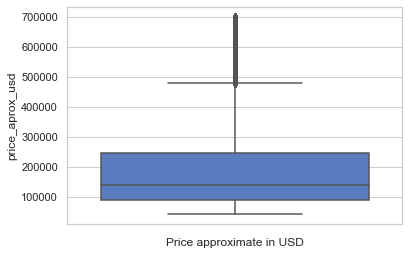

In [20]:
sns.set_style("whitegrid")

ax = sns.boxplot(y="price_aprox_usd", data=properati_filtered)
ax.set_xlabel('Price approximate in USD')

Text(0.5, 0, 'Price approximate in USD per m2')

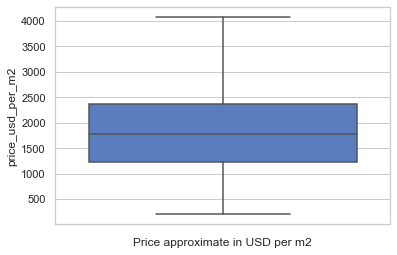

In [21]:
sns.set_style("whitegrid")

ax = sns.boxplot(y="price_usd_per_m2", data=properati_filtered2)
ax.set_xlabel('Price approximate in USD per m2')

Text(0.5, 0, 'Price approximate in local currency')

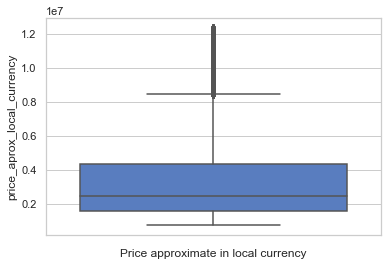

In [22]:
sns.set_style("whitegrid")

ax = sns.boxplot(y="price_aprox_local_currency", data=properati_filtered3)
ax.set_xlabel('Price approximate in local currency')

Text(0.5, 0, 'Price approximate per m2')

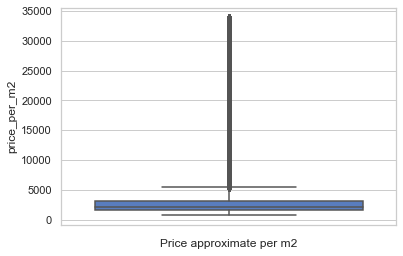

In [23]:
sns.set_style("whitegrid")

ax = sns.boxplot(y="price_per_m2", data=properati_filtered4)
ax.set_xlabel('Price approximate per m2')

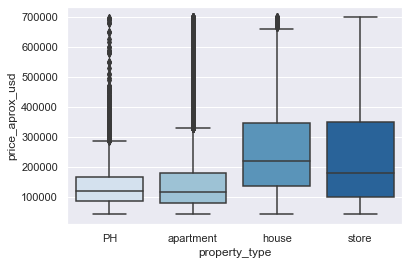

In [140]:
sns.set(style="darkgrid")

sns.boxplot(x=df["property_type"], y=properati_filtered['price_aprox_usd'], palette="Blues")
plt.show()

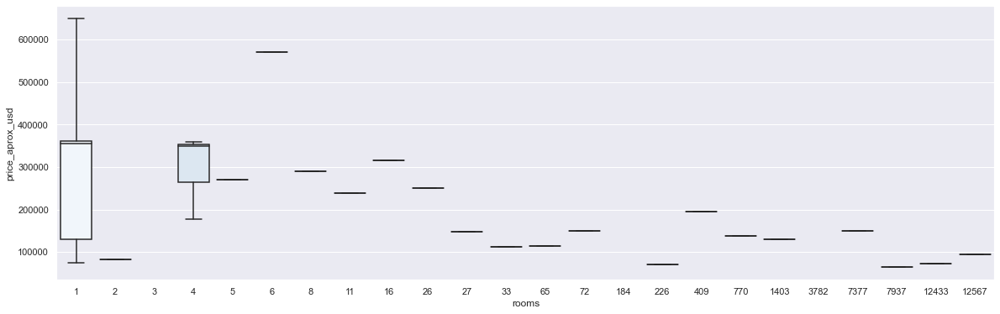

In [141]:
sns.set(style="darkgrid")
plt.figure(figsize=(20, 6))
sns.boxplot(x=df["rooms"].value_counts(), y=properati_filtered['price_aprox_usd'], palette="Blues")
plt.show()

#### Viz & Analysis

Places with the largest number of properties

Text(0.5, 1.0, 'Number of properties per area')

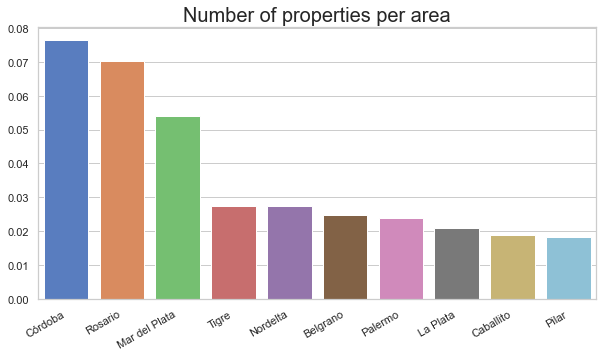

In [32]:
plt.figure(figsize=(10,5))
plot = sns.barplot(x=lugares.head(10).index, y=lugares.head(10).values)
plot.set_xticklabels(plot.get_xticklabels(), rotation=30, horizontalalignment='right')
plot.set_title("Number of properties per area", fontsize=20)

Properties with its number of rooms

Text(0.5, 1.0, 'Properties with its number of rooms')

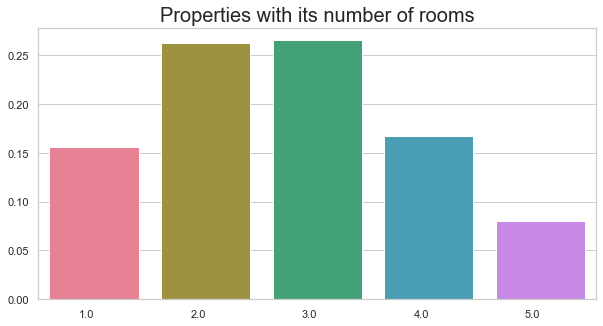

In [33]:
plt.figure(figsize=(10,5))
plot = sns.barplot(x=room.head(10).index, y=room.head(10).values, palette="husl")
plot.set_xticklabels(plot.get_xticklabels(), rotation=0, horizontalalignment='right')
plot.set_title("Properties with its number of rooms", fontsize=20)

Types of properties x quantity

Text(0.5, 1.0, 'Types of properties x quantity')

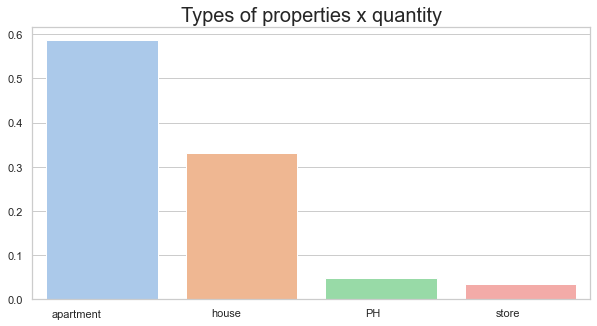

In [34]:
plt.figure(figsize=(10,5))
plot = sns.barplot(x=prop.head(10).index, y=prop.head(10).values,  palette="pastel")
plot.set_xticklabels(plot.get_xticklabels(), rotation=0, horizontalalignment='right')
plot.set_title("Types of properties x quantity", fontsize=20)

We plot the top 10 of the most repeated State Names and their prices

In [36]:
price = df['price_aprox_usd'].value_counts(normalize=True)

price

120000.00     0.016506
130000.00     0.014433
150000.00     0.013838
110000.00     0.013203
85000.00      0.012935
                ...   
229800.00     0.000010
63554.13      0.000010
102012.28     0.000010
160379.18     0.000010
1110000.00    0.000010
Name: price_aprox_usd, Length: 10364, dtype: float64

Text(0.5, 1.0, 'Price of properties by area')

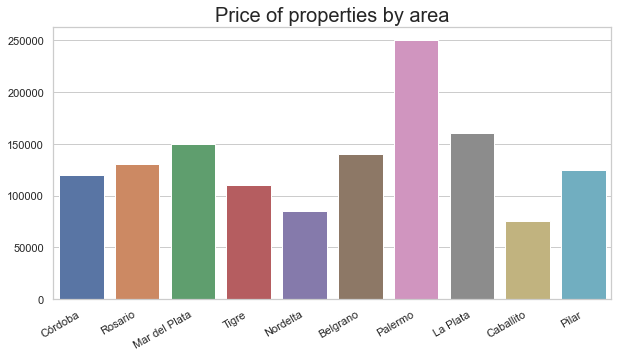

In [37]:
plt.figure(figsize=(10,5))
plot = sns.barplot(x=lugares.head(10).index, y=price.head(10).index,  palette="deep")
plot.set_xticklabels(plot.get_xticklabels(), rotation=30, horizontalalignment='right')
plot.set_title("Price of properties by area", fontsize=20)

Text(0.5, 1.0, 'Price per m2 of properties by area')

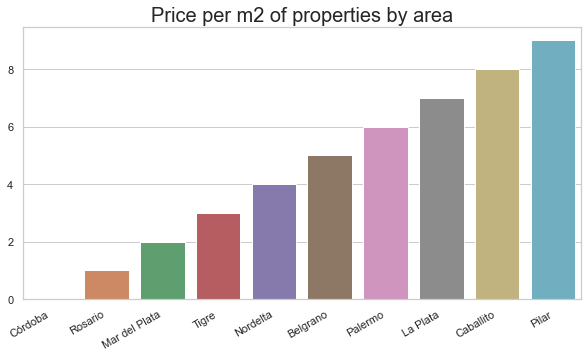

In [39]:
plt.figure(figsize=(10,5))
plot = sns.barplot(x=lugares.head(10).index, y=df['price_usd_per_m2'].head(10).index,  palette="deep")
plot.set_xticklabels(plot.get_xticklabels(), rotation=30, horizontalalignment='right')
plot.set_title("Price per m2 of properties by area", fontsize=20)

#### Analysis per area

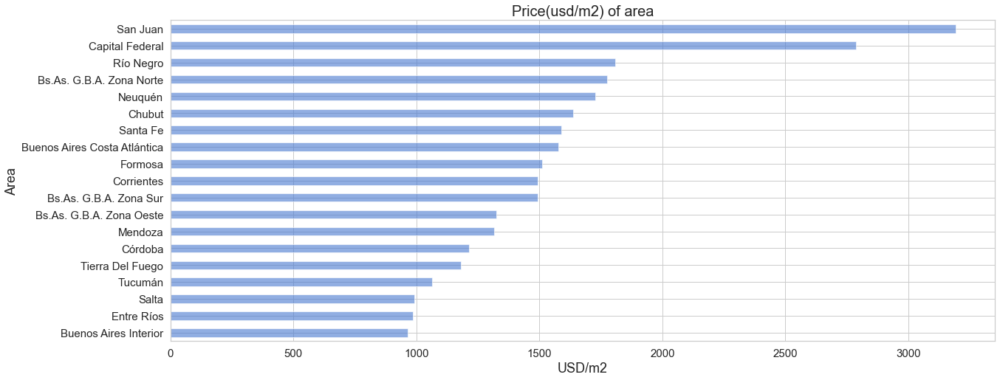

In [40]:
zone = properati_filtered.groupby('state_name').mean()['price_usd_per_m2'].sort_values(ascending=False)[0:19]
graph2 = zone.sort_values().plot.barh(figsize=(20,8),color='b',fontsize=15, alpha=0.6);
graph2.set_title("Price(usd/m2) of area", fontsize=20)
graph2.set_ylabel("Area", fontsize=18)
graph2.set_xlabel("USD/m2", fontsize=18)
plt.show()

Los

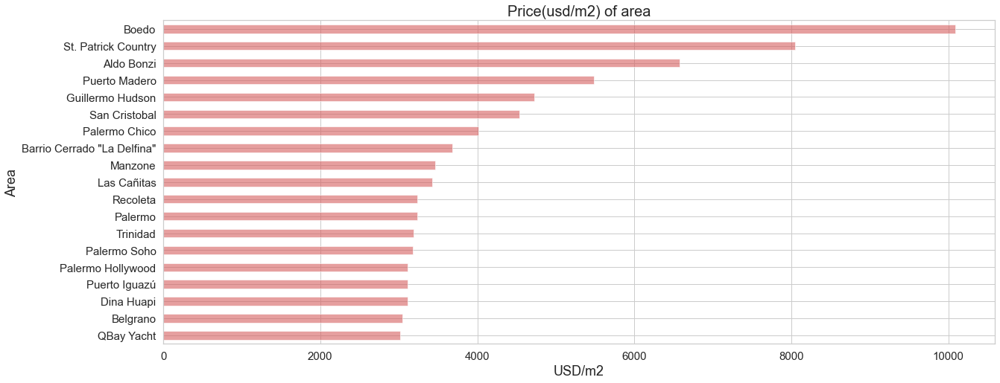

In [41]:
zone = properati_filtered.groupby('place_name').mean()['price_usd_per_m2'].sort_values(ascending=False)[0:19]
graph2 = zone.sort_values().plot.barh(figsize=(20,8),color='r',fontsize=15, alpha=0.6);
graph2.set_title("Price(usd/m2) of area", fontsize=20)
graph2.set_ylabel("Area", fontsize=18)
graph2.set_xlabel("USD/m2", fontsize=18)
plt.show()

#### Filter for city

Capital Federal

In [43]:
capitalFederal = df.loc[df.state_name.str.contains("Capital Federal", na=False),:]
GBA =df.loc[df.state_name.str.contains("G.B.A", na=False),:]
properati = pd.concat([capitalFederal,GBA])

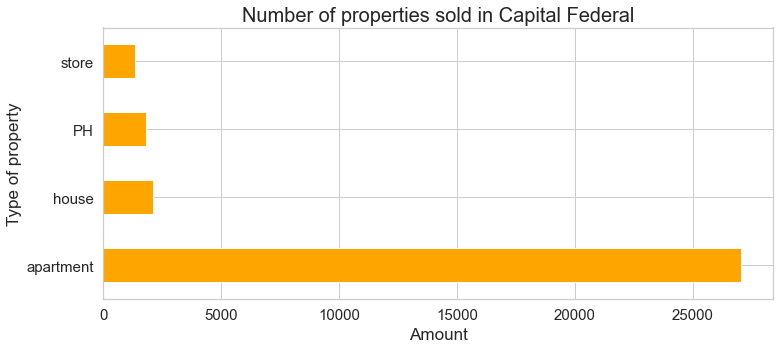

In [44]:
capitalFederal_filtrada = capitalFederal.loc[:,['property_type','place_name']]
capitalFederal_filtrada.dropna(inplace=True)
capitalFederal_filtrada = capitalFederal_filtrada['property_type'].apply(lambda x: Series(x).value_counts()).sum().sort_values(ascending= False )
capitalFederal_filtrada.plot.barh(figsize=(12,5),color='orange', fontsize=15);
plt.title('Number of properties sold in Capital Federal', fontsize=20);
plt.xlabel('Amount', fontsize=17);
plt.ylabel('Type of property', fontsize=17);
plt.show();

#### Analysis by number of rooms

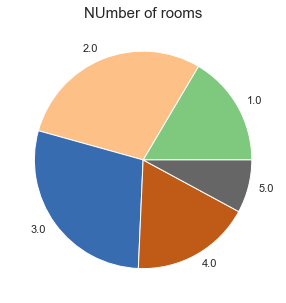

In [45]:
df_room = properati_filtered.loc[properati_filtered.rooms < 6,['rooms','price_usd_per_m2']]
grouped_rooms = df_room.groupby('rooms').size().plot(kind='pie', figsize=(5,5),cmap='Accent',fontsize=11)
plt.title('NUmber of rooms', fontsize = 15)
plt.ylabel('')
plt.show()

#### Price in USD / m2 in relation to the number of rooms the property has

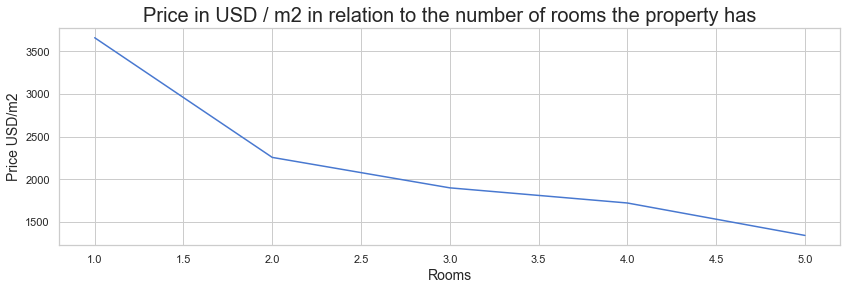

In [46]:
df_room.groupby('rooms').mean()['price_usd_per_m2'].plot(figsize=(14,4),fontsize=11);
plt.title('Price in USD / m2 in relation to the number of rooms the property has', fontsize= 20);
plt.xlabel('Rooms', fontsize = 14);
plt.ylabel('Price USD/m2', fontsize=14);
plt.show();

Con estas dos visualizaciones se puede ver que las propiedades de 3 cuartos, que son las que más se venden, tienen en promedio un precio intermedio en comparación con las demás, y que la relación entre el precio en dólares por metro cuadrado con respecto a la cantidad de cuartos es indirectamente proporcional, osea que si uno quiere comprar una vivienda el metro cuadrado le va a salir más caro si compra una vivienda de 1 habitación que de 3. Es decir, que si uno tiene la plata, le conviene comprar una vivienda más grande que una más chica, en cuestión de rentabilidad.

#### Analysis by number of floors

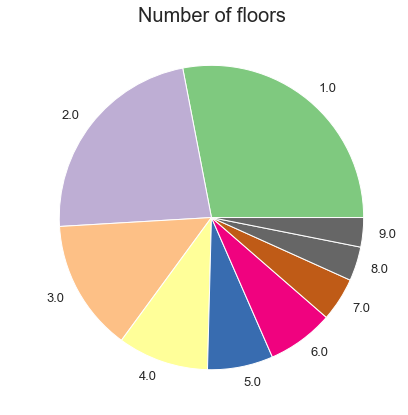

In [47]:
df_floor = properati_filtered.loc[properati_filtered.floor <10,['floor','price_usd_per_m2']]
df_floor.groupby('floor').size().plot(kind='pie', figsize=(7,7), fontsize= 13,cmap="Accent")
plt.title('Number of floors', fontsize=20);
plt.ylabel(' ');
plt.show();

#### Prices per square meter depending on the number of floors

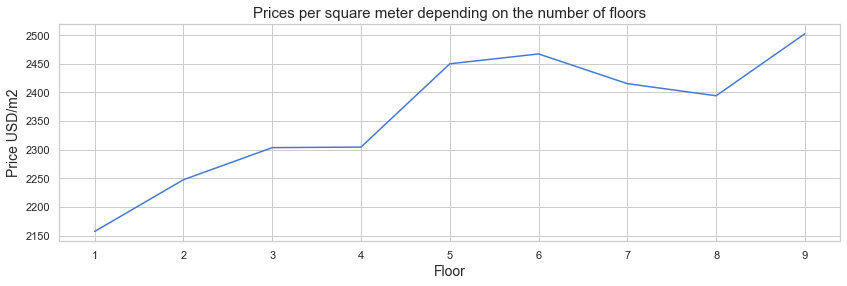

In [48]:
df_floor.groupby('floor').mean()['price_usd_per_m2'].plot(figsize=(14,4));
plt.title('Prices per square meter depending on the number of floors', fontsize= 15);
plt.xlabel('Floor', fontsize = 14);
plt.ylabel('Price USD/m2', fontsize=14);
plt.show();

## Conclusion

To begin this conclusion, it is important to recap everything that has been done.

In the first instance, we noticed that the dataset needed some prior cleaning to be able to start working on it. This implied the elimination of:

- columns that were not of any relevance such as 'title', 'description', 'url', etc.
- outliers that were left by mistake or that did not add significance to the analysis.

After working on the dataset, having filtered it correctly and mainly having cleaned the 'price_aprox_usd' variable, we are left with a new DataFrame that was properati_filtered that had this normalized column.

Based on that we begin to graph and compare variables. Based on this, the following results could be reached:

- The properties with 3, 2, 1 rooms -in that order- are the ones that we find in the greatest quantity that are offered;
- all of them are for sale, that is, none are offered for rent;
- It was found that most of the more expensive properties have fewer rooms, which implies that there is a very large sale of small but more "luxurious" properties;
- there are a large number of structures with 1, 2, 3 and 4 floors -in this order-;
- The more floors it has, the more expensive the properties are, which leads us to think that it is the PH which are sold in this category, which are more expensive and are located on the top floors of the buildings;
- in Córdoba and Rosario we find the largest number of properties for sale;
- most of the available properties are apartments;
- the most expensive total prices (USD) are found in Palermo;
- the city with properties with the most expensive m2 is Pilar;
- the province with properties with the most expensive m2 is San Juan;
- the place with properties with the most expensive m2 is Boedo.

We can infer these results thanks to the visualization of the graphs that we previously plotted. As a closing of this work, it can be concluded that, beyond the fact that this analysis could continue because it is possible to find new parameters that affect the price variation, the location of the property is definitely one of the most important and decisive factors in the price of the same. However, both the amount of m2, floors and rooms that the property has, are also variables that were relevant when carrying out the analysis.